https://okumuralab.org/~okumura/python/t_u_test.html はヒストグラムを使っている点が非常によろしくない。

関連ノートブック: https://github.com/genkuroki/public/blob/main/0051/Student%20vs.%20Welch.ipynb

In [1]:
using Random
using Distributions
using Plots
using HypothesisTests
using QuadGK
using Roots

distname(dist) = replace(string(dist), r"{[^}]*}"=>"")
distname(dist::InverseGamma) = "InverseGamma(α=$(shape(dist)), θ=$(scale(dist)))"
safe_pdf(dist, x) = minimum(dist) < x < maximum(dist) ? pdf(dist, x) : zero(eltype(dist))

default(fmt=:png, legend=false, titlefontsize=10, plot_titlefontsize=10, size=(320, 200))

# approximate Mann-Whitney U-testではデフォルトでは連続性補正がかかっている。
# https://github.com/JuliaStats/HypothesisTests.jl/blob/master/src/mann_whitney.jl#L236-L249
my_pvalue(x::ApproximateMannWhitneyUTest; continuity_correction=true) =
    continuity_correction ? pvalue(x) : 2ccdf(Normal(), abs(x.mu)/x.sigma)

function win_rate_of_y_against_x(distx::UnivariateDistribution, disty::ContinuousUnivariateDistribution)
    f(y) = cdf(distx, y) * pdf(disty, y)
    quadgk(f, extrema(disty)...)[1]
end

function equalizing_handicap(distx::UnivariateDistribution, disty::ContinuousUnivariateDistribution; p=1/2)
    f(s) = win_rate_of_y_against_x(distx + s, disty) - p
    find_zero(f, 0.0)
end

function p_values(distx, m, disty, n; niters=10^6, continuity_correction=true,
        handicap_mean = mean(disty) - mean(distx),
        handicap_win_rate = equalizing_handicap(distx, disty),
    )
    exact_mwu = m + n ≤ 66 ? true : false
    name_mwu = exact_mwu ? "exact Mann-Whitney U-test" : "approximate Mann-Whitney U-test"
    pvalue_student_t = zeros(niters)
    pvalue_welch_t = zeros(niters)
    pvalue_mann_whitney_u = zeros(niters)
    pvalue_mann_whitney_u_approximate = zeros(niters)
    nth = Threads.nthreads(:interactive) + Threads.nthreads(:default)
    tmpx = [zeros(m) for _ in 1:nth]
    tmpy = [zeros(n) for _ in 1:nth]
    Threads.@threads :static for i in 1:niters
        tid = Threads.threadid()
        datax = rand!(distx, tmpx[tid])
        datay = rand!(disty, tmpy[tid])
        datax .+= handicap_mean
        pvalue_student_t[i] = pvalue(EqualVarianceTTest(datax, datay))
        pvalue_welch_t[i] = pvalue(UnequalVarianceTTest(datax, datay))
        datax .-= handicap_mean
        datax .+= handicap_win_rate
        if exact_mwu
            pvalue_mann_whitney_u[i] = pvalue(ExactMannWhitneyUTest(datax, datay))
        else
            pvalue_mann_whitney_u[i] = pvalue(ApproximateMannWhitneyUTest(datax, datay))
        end
        pvalue_mann_whitney_u_approximate[i] = my_pvalue(ApproximateMannWhitneyUTest(datax, datay); continuity_correction)
    end
    (; name_mwu, pvalue_student_t, pvalue_welch_t, pvalue_mann_whitney_u, pvalue_mann_whitney_u_approximate)
end
    
function hist_p_values(distx, m, disty, n; niters=10^6, bin=0:0.05:1.05, continuity_correction=true,
        handicap_mean = mean(disty) - mean(distx),
        handicap_win_rate = equalizing_handicap(distx, disty),
    )
    @time (;name_mwu,  pvalue_student_t, pvalue_welch_t, pvalue_mann_whitney_u, pvalue_mann_whitney_u_approximate) =
        p_values(distx, m, disty, n; niters, continuity_correction, handicap_mean, handicap_win_rate)
    P1 = histogram(pvalue_student_t; norm=true, c=1, alpha=0.5, title="Student t-test", bin)
    P2 = histogram(pvalue_welch_t; norm=true, c=2, alpha=0.5, title="Welch t-test", bin)
    P3 = histogram(pvalue_mann_whitney_u; norm=true, c=3, alpha=0.5, title=name_mwu, bin)
    P4 = histogram(pvalue_mann_whitney_u_approximate; norm=true, c=4, alpha=0.5, title="approximate Mann-Whitney U-test", bin)
    plot(P1, P2, P3, P4; size=(640, 400), layout=(2, 2))
    plot!(plot_title="$(distname(distx)), m=$m vs. $(distname(disty)), n=$n")
end

_ecdf(A, x) = count(≤(x), A) / length(A)

function ecdf_p_values(distx, m, disty, n; niters=10^6, maxalpha=1, continuity_correction=true,
        handicap_mean = mean(disty) - mean(distx),
        handicap_win_rate = equalizing_handicap(distx, disty),
    )
    @time (;name_mwu,  pvalue_student_t, pvalue_welch_t, pvalue_mann_whitney_u, pvalue_mann_whitney_u_approximate) =
        p_values(distx, m, disty, n; niters, continuity_correction, handicap_mean, handicap_win_rate)
    P1 = plot(x -> _ecdf(pvalue_student_t, x), 0, maxalpha; c=1, title="Student t-test")
    plot!(identity; ls=:dot, c=:gray, alpha=0.8)
    P2 = plot(x -> _ecdf(pvalue_welch_t, x), 0, maxalpha; c=2, title="Welch t-test")
    plot!(identity; ls=:dot, c=:gray, alpha=0.8)
    P3 = plot(x -> _ecdf(pvalue_mann_whitney_u, x), 0, maxalpha; c=3, title=name_mwu)
    plot!(identity; ls=:dot, c=:gray, alpha=0.8)
    P4 = plot(x -> _ecdf(pvalue_mann_whitney_u_approximate, x), 0, maxalpha; c=4, title="approximate Mann-Whitney U-test")
    plot!(identity; ls=:dot, c=:gray, alpha=0.8)
    plot(P1, P2, P3, P4; size=(640, 640), layout=(2, 2))
    plot!(plot_title="$(distname(distx)), m=$m vs. $(distname(disty)), n=$n")
end

ecdf_p_values (generic function with 1 method)

## P値の経験分布のヒストグラム

  1.973094 seconds (55.78 M allocations: 4.311 GiB, 26.26% gc time, 445.96% compilation time)


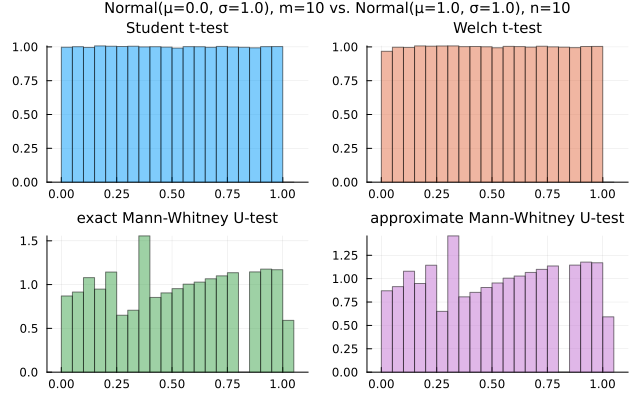

In [2]:
hist_p_values(Normal(), 10, Normal(1), 10)

  1.070636 seconds (52.74 M allocations: 4.202 GiB, 29.28% gc time)


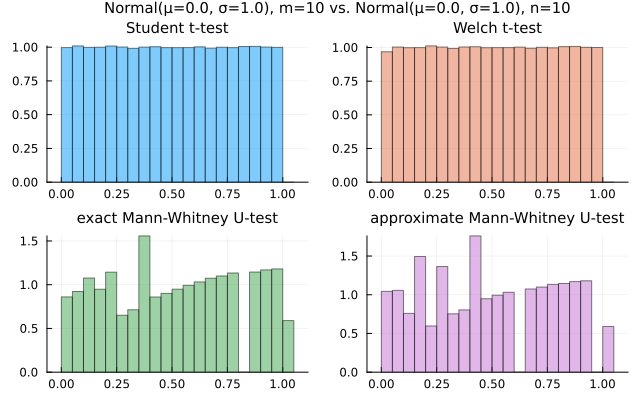

In [3]:
hist_p_values(Normal(), 10, Normal(), 10; continuity_correction=false)

  1.182153 seconds (52.73 M allocations: 4.201 GiB, 35.32% gc time)


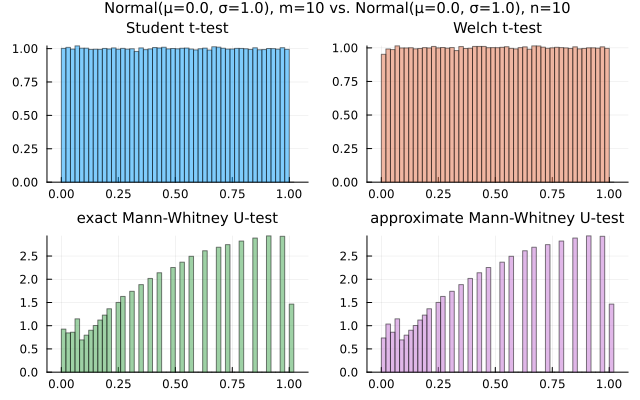

In [4]:
hist_p_values(Normal(), 10, Normal(), 10; bin=0:0.02:1.02)

  1.081571 seconds (52.73 M allocations: 4.200 GiB, 25.98% gc time)


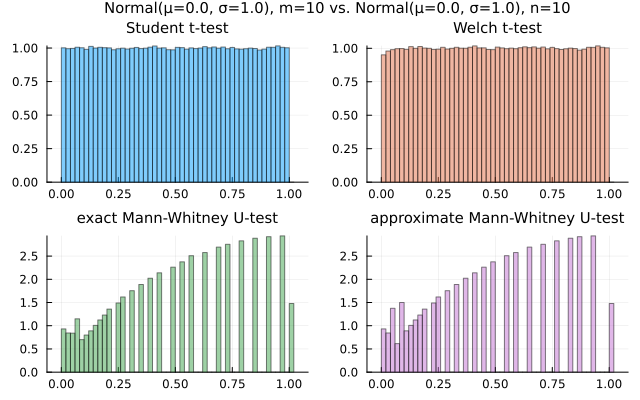

In [5]:
hist_p_values(Normal(), 10, Normal(), 10; bin=0:0.02:1.02, continuity_correction=false)

  1.214904 seconds (40.05 M allocations: 3.754 GiB, 33.35% gc time, 78.74% compilation time)


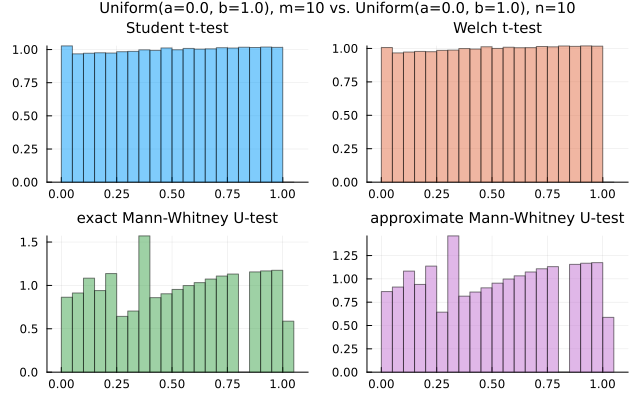

In [6]:
hist_p_values(Uniform(), 10, Uniform(), 10)

  1.106307 seconds (39.82 M allocations: 3.744 GiB, 28.02% gc time)


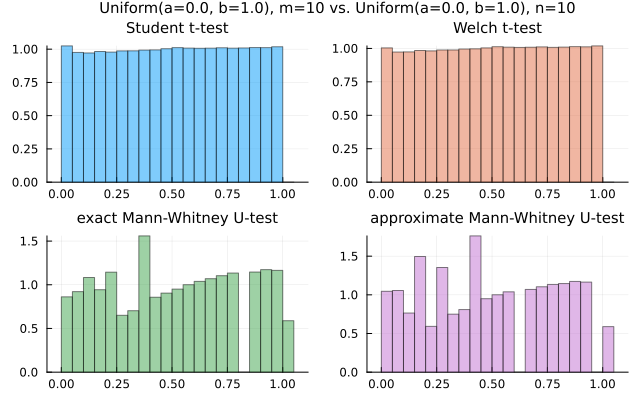

In [7]:
hist_p_values(Uniform(), 10, Uniform(), 10; continuity_correction=false)

  1.158697 seconds (39.82 M allocations: 3.744 GiB, 37.23% gc time)


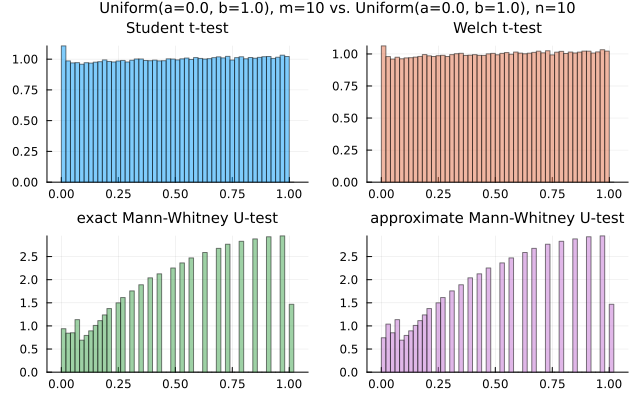

In [8]:
hist_p_values(Uniform(), 10, Uniform(), 10; bin=0:0.02:1.02)

  0.989937 seconds (39.82 M allocations: 3.744 GiB, 26.02% gc time)


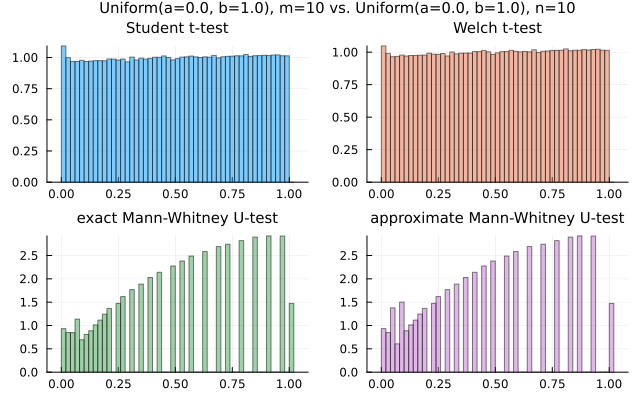

In [9]:
hist_p_values(Uniform(), 10, Uniform(), 10; bin=0:0.02:1.02, continuity_correction=false)

skewness(dist) = 41.952353926806026


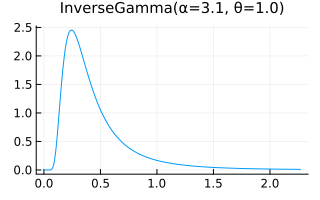

In [10]:
dist = InverseGamma(3.1, 1)
@show skewness(dist)
plot(x -> pdf(dist, x), 0, 5std(dist); title=distname(dist))

  1.179071 seconds (40.58 M allocations: 3.826 GiB, 32.51% gc time, 84.25% compilation time)


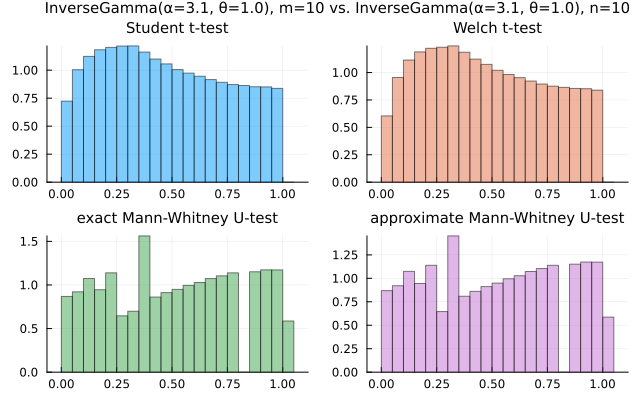

In [11]:
hist_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10)

  0.978531 seconds (40.33 M allocations: 3.816 GiB, 25.38% gc time)


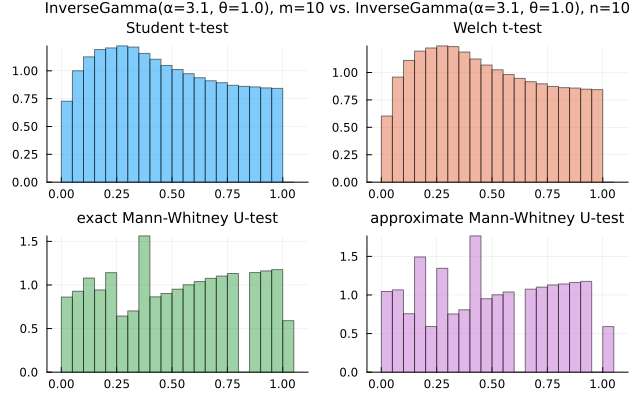

In [12]:
hist_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10; continuity_correction=false)

  1.200997 seconds (40.32 M allocations: 3.816 GiB, 35.08% gc time)


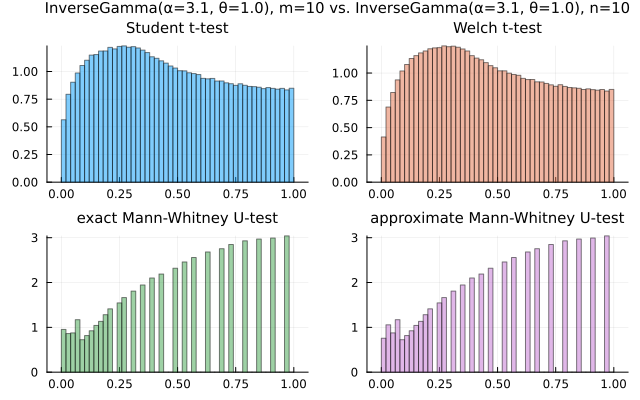

In [13]:
hist_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10; bin=0:0.02:1)

  1.005557 seconds (40.32 M allocations: 3.816 GiB, 25.76% gc time)


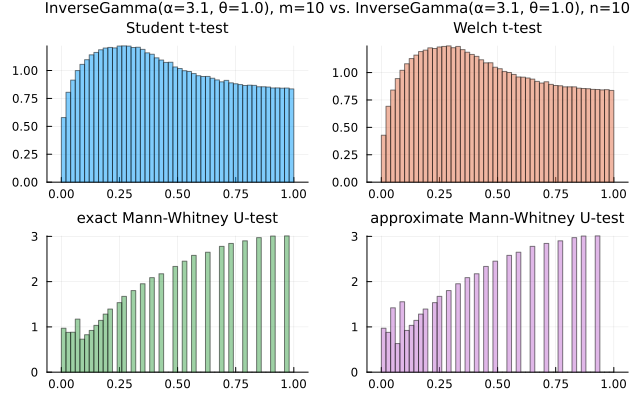

In [14]:
hist_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10; bin=0:0.02:1, continuity_correction=false)

## P値の経験累積分布関数のグラフ

### 等分布の場合

  1.304821 seconds (52.73 M allocations: 4.200 GiB, 35.82% gc time)


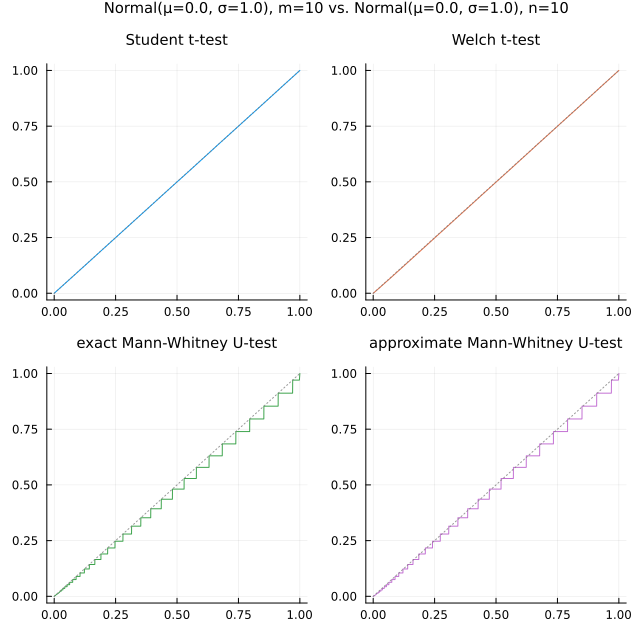

In [15]:
ecdf_p_values(Normal(), 10, Normal(), 10)

  1.085181 seconds (52.73 M allocations: 4.200 GiB, 26.74% gc time)


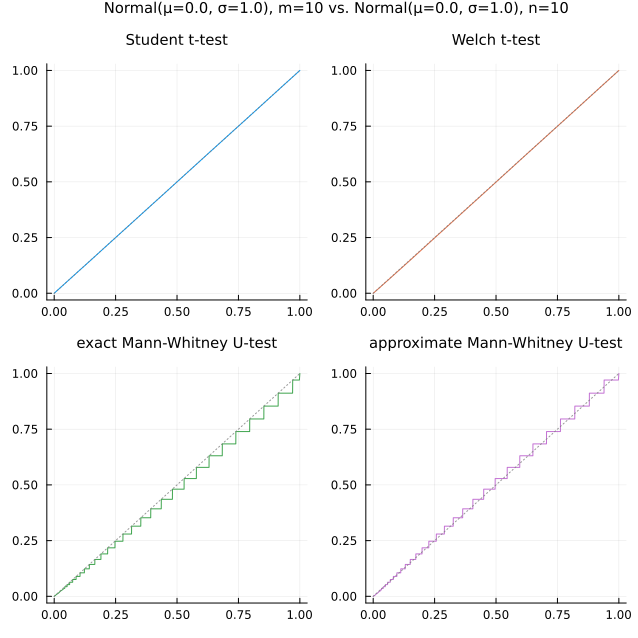

In [16]:
ecdf_p_values(Normal(), 10, Normal(), 10; continuity_correction=false)

  1.249085 seconds (39.82 M allocations: 3.744 GiB, 37.18% gc time)


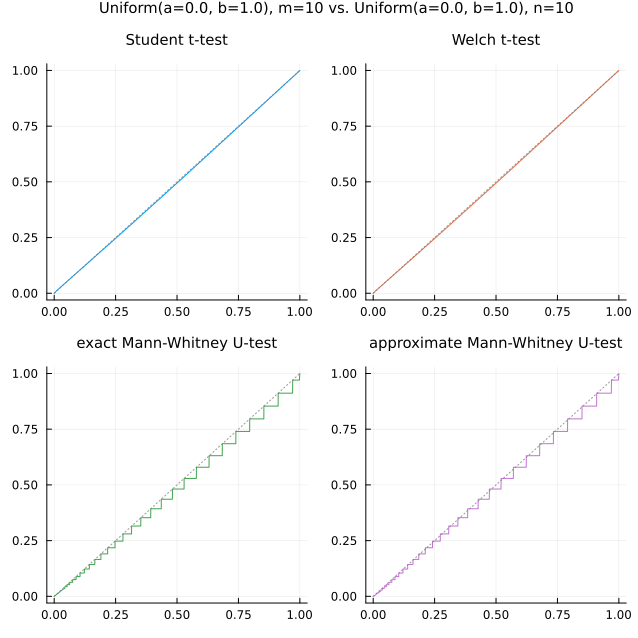

In [17]:
ecdf_p_values(Uniform(), 10, Uniform(), 10)

  1.007857 seconds (39.82 M allocations: 3.744 GiB, 25.66% gc time)


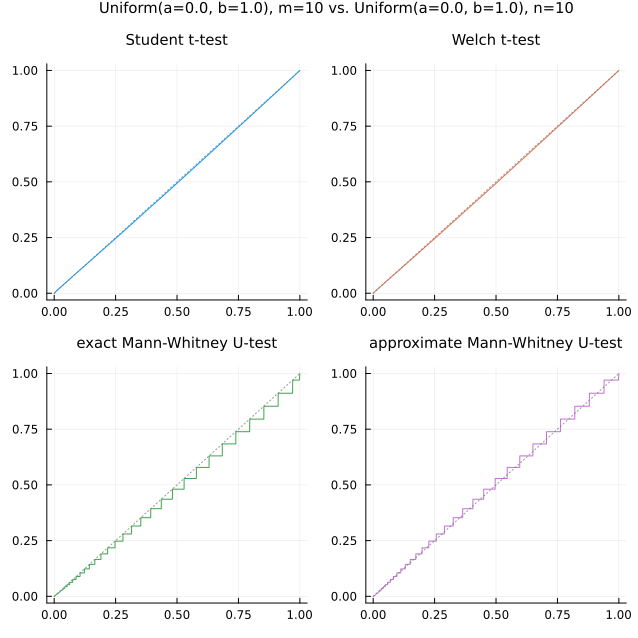

In [18]:
ecdf_p_values(Uniform(), 10, Uniform(), 10; continuity_correction=false)

skewness(dist) = 41.952353926806026


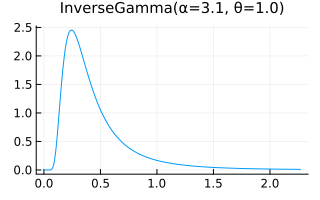

In [19]:
dist = InverseGamma(3.1, 1)
@show skewness(dist)
plot(x -> pdf(dist, x), 0, 5std(dist); title=distname(dist))

  1.164168 seconds (40.32 M allocations: 3.815 GiB, 34.32% gc time)


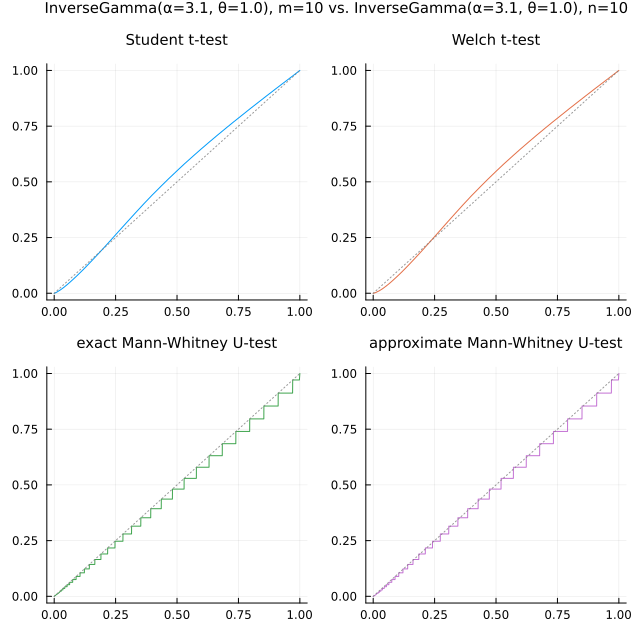

In [20]:
ecdf_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10)

  1.070774 seconds (40.32 M allocations: 3.815 GiB, 26.51% gc time)


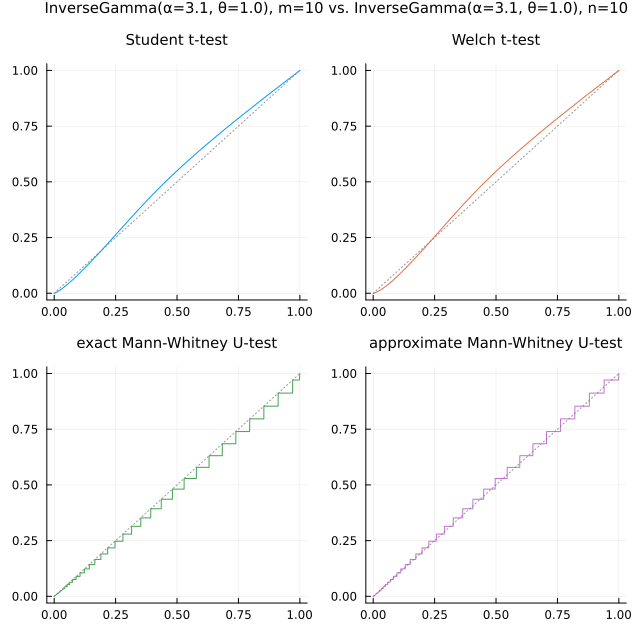

In [21]:
ecdf_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10; continuity_correction=false)

  1.342129 seconds (40.31 M allocations: 3.814 GiB, 34.97% gc time)


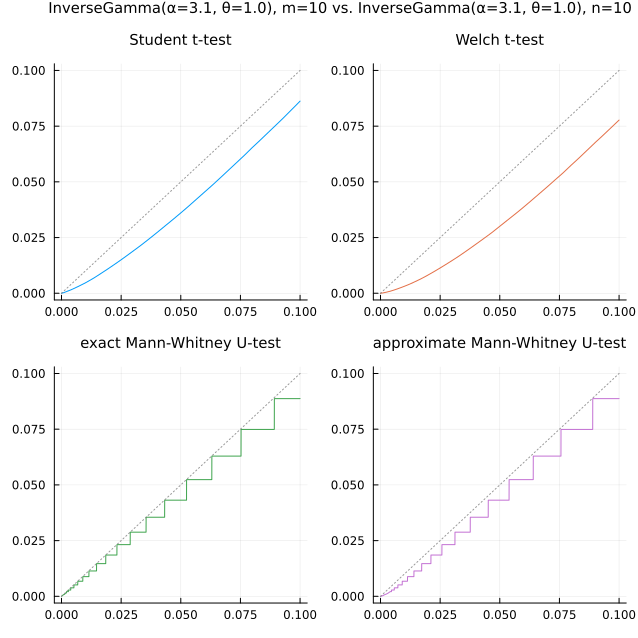

In [22]:
ecdf_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10; maxalpha=0.1)

  1.042610 seconds (40.31 M allocations: 3.814 GiB, 24.86% gc time)


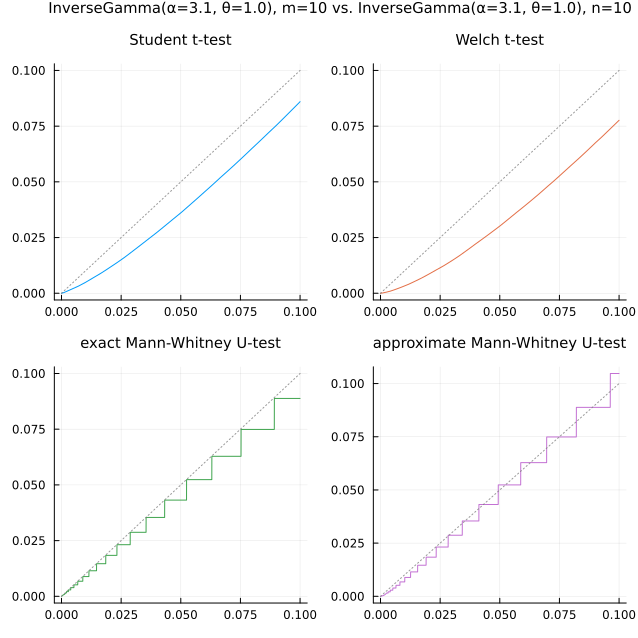

In [23]:
ecdf_p_values(InverseGamma(3.1, 1), 10, InverseGamma(3.1, 1), 10; maxalpha=0.1, continuity_correction=false)

  0.862495 seconds (36.34 M allocations: 2.301 GiB, 38.13% gc time)


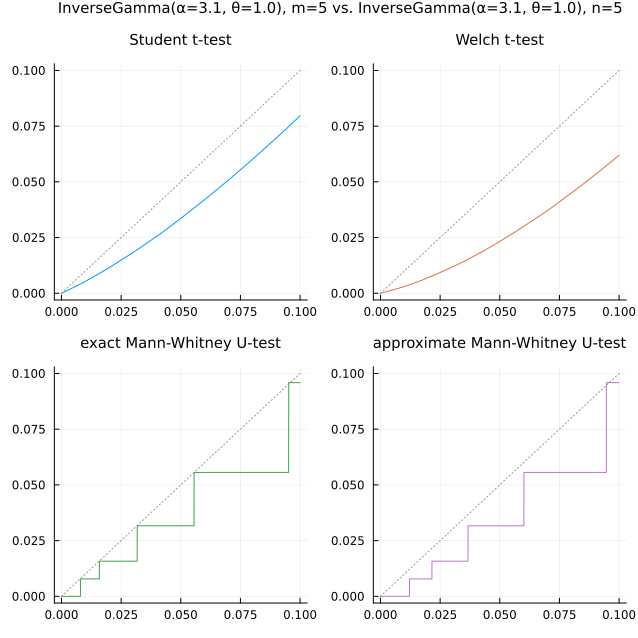

In [24]:
ecdf_p_values(InverseGamma(3.1, 1), 5, InverseGamma(3.1, 1), 5; maxalpha=0.1)

  0.699607 seconds (36.33 M allocations: 2.300 GiB, 24.52% gc time)


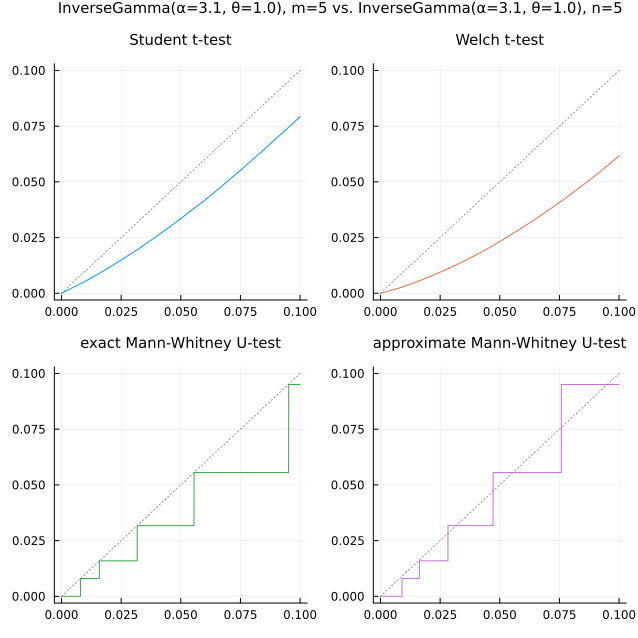

In [25]:
ecdf_p_values(InverseGamma(3.1, 1), 5, InverseGamma(3.1, 1), 5; maxalpha=0.1, continuity_correction=false)

  1.127959 seconds (40.30 M allocations: 3.035 GiB, 38.03% gc time)


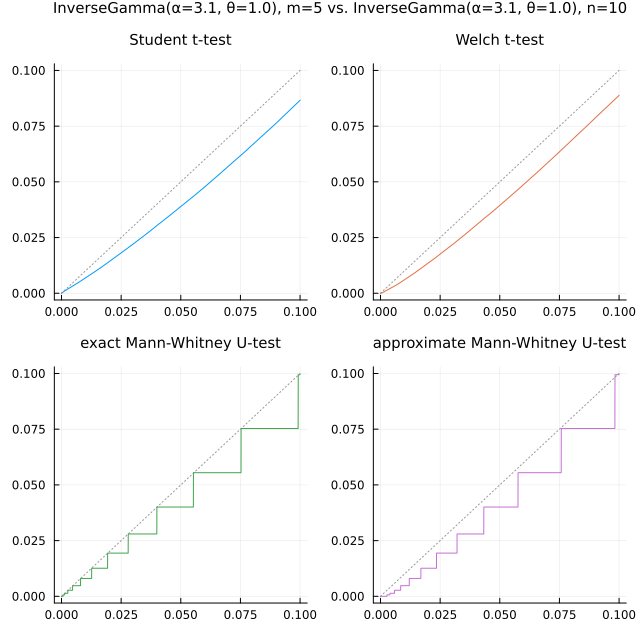

In [26]:
ecdf_p_values(InverseGamma(3.1, 1), 5, InverseGamma(3.1, 1), 10; maxalpha=0.1)

  0.806410 seconds (40.30 M allocations: 3.035 GiB, 24.19% gc time)


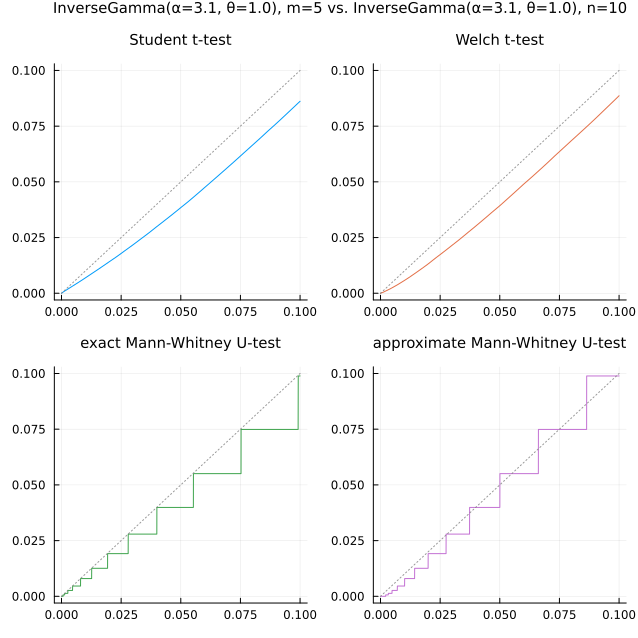

In [27]:
ecdf_p_values(InverseGamma(3.1, 1), 5, InverseGamma(3.1, 1), 10; maxalpha=0.1, continuity_correction=false)

  1.382309 seconds (44.69 M allocations: 4.563 GiB, 32.18% gc time)


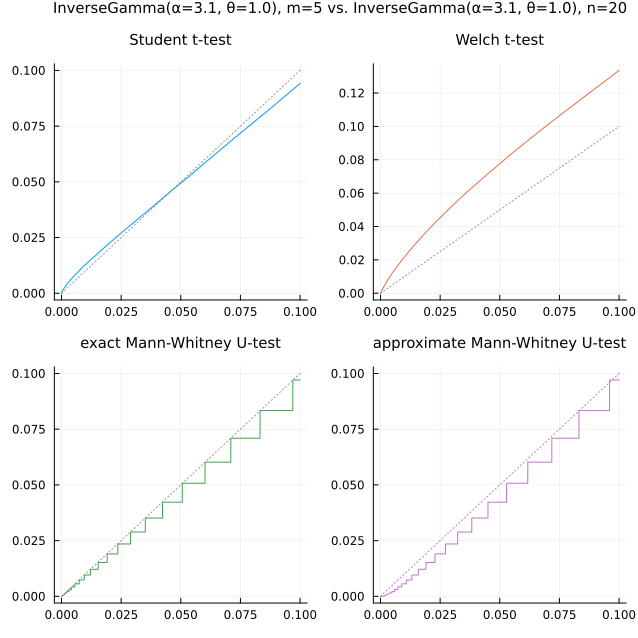

In [28]:
ecdf_p_values(InverseGamma(3.1, 1), 5, InverseGamma(3.1, 1), 20; maxalpha=0.1)

  1.267077 seconds (44.69 M allocations: 4.563 GiB, 24.26% gc time)


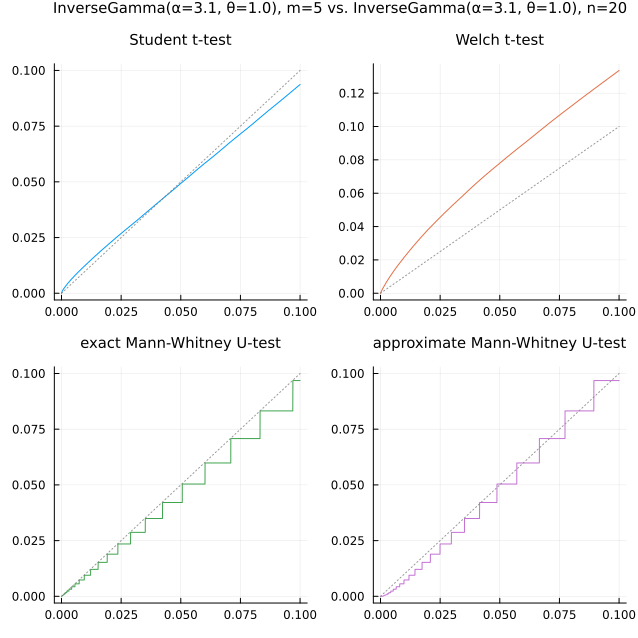

In [29]:
ecdf_p_values(InverseGamma(3.1, 1), 5, InverseGamma(3.1, 1), 20; maxalpha=0.1, continuity_correction=false)

### 非等分布の場合

#### 分散が異なる2つの正規分布の場合

  1.433227 seconds (52.54 M allocations: 4.162 GiB, 35.46% gc time)


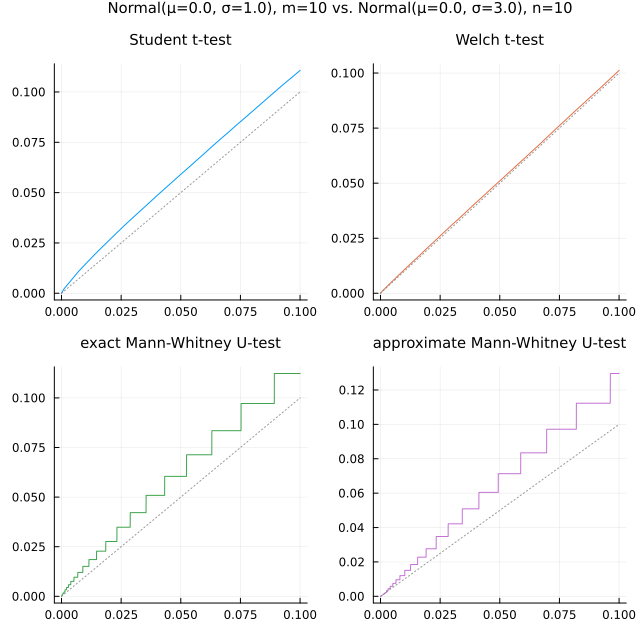

In [30]:
ecdf_p_values(Normal(0, 1), 10, Normal(0, 3), 10; maxalpha=0.1, continuity_correction=false)

  2.457237 seconds (58.89 M allocations: 7.852 GiB, 20.50% gc time)


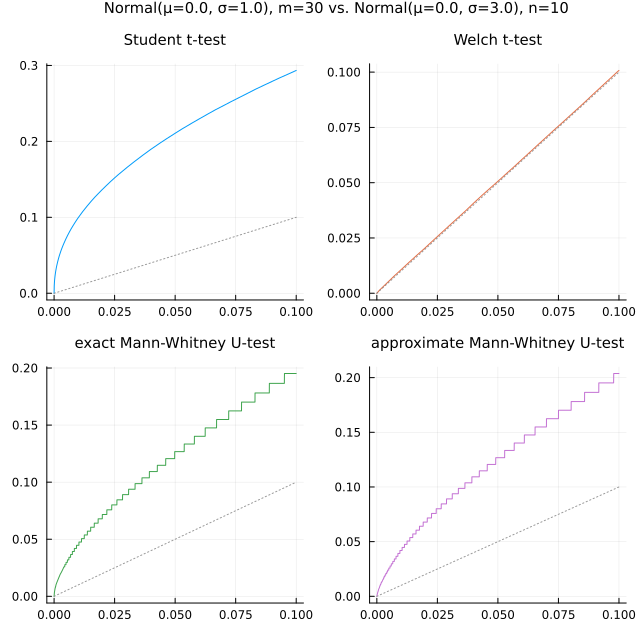

In [31]:
ecdf_p_values(Normal(0, 1), 30, Normal(0, 3), 10; maxalpha=0.1, continuity_correction=false)

  2.583814 seconds (56.37 M allocations: 7.672 GiB, 23.85% gc time)


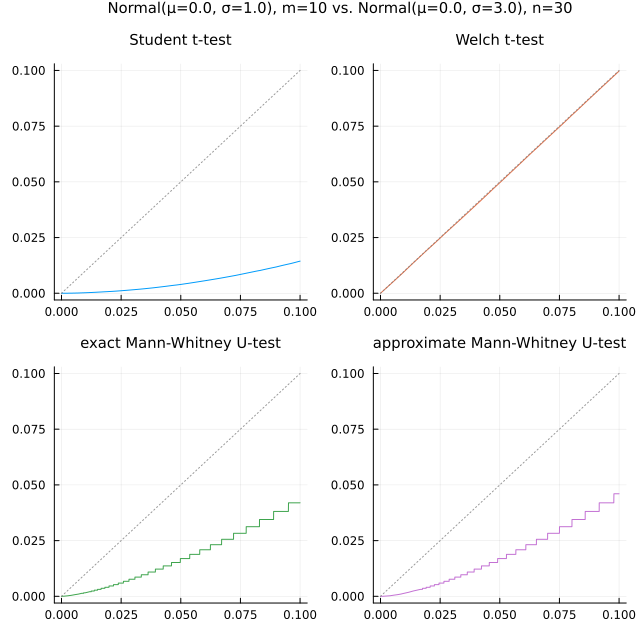

In [32]:
ecdf_p_values(Normal(0, 1), 10, Normal(0, 3), 30; maxalpha=0.1, continuity_correction=false)

  4.667839 seconds (57.88 M allocations: 21.671 GiB, 27.42% gc time)


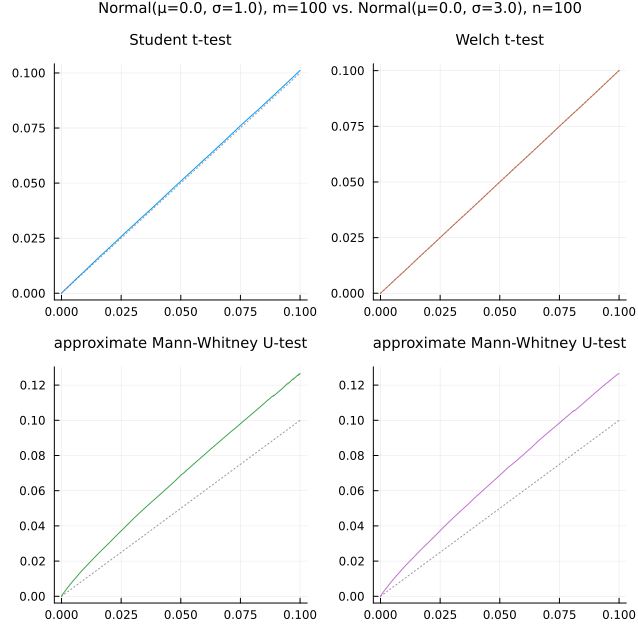

In [33]:
ecdf_p_values(Normal(0, 1), 100, Normal(0, 3), 100; maxalpha=0.1, continuity_correction=false)

  9.502553 seconds (68.46 M allocations: 42.169 GiB, 33.54% gc time)


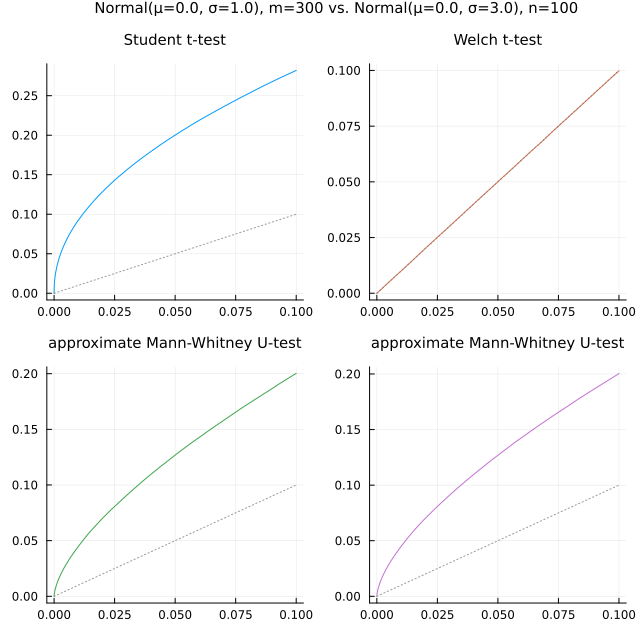

In [34]:
ecdf_p_values(Normal(0, 1), 300, Normal(0, 3), 100; maxalpha=0.1, continuity_correction=false)

  9.180227 seconds (65.36 M allocations: 41.719 GiB, 31.44% gc time)


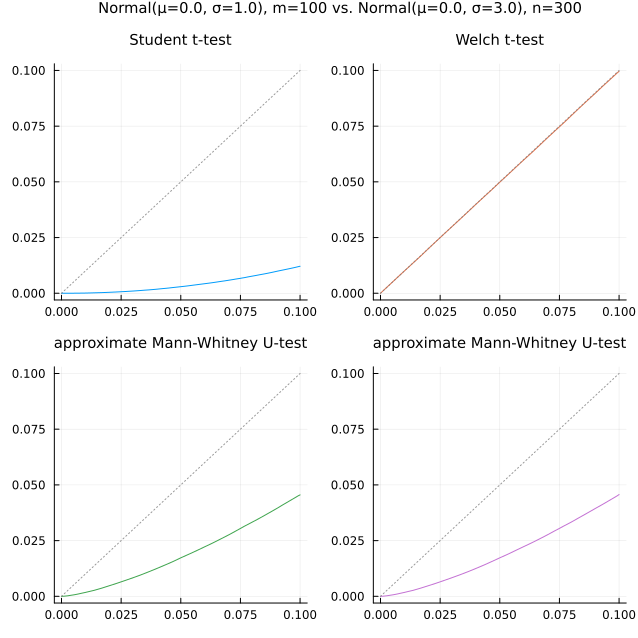

In [35]:
ecdf_p_values(Normal(0, 1), 100, Normal(0, 3), 300; maxalpha=0.1, continuity_correction=false)

#### 分散が異なる2つの逆ガンマ分布の場合

distname(distx) = "InverseGamma(α=3.1, θ=1.0)"
distname(disty) = "InverseGamma(α=3.1, θ=3.0)"
std(disty) / std(distx) = 3.0
skewness(distx) = 41.952353926806026
skewness(disty) = 41.952353926806026
handicap_mean = mean(disty) - mean(distx) = 0.9523809523809524
handicap_win_rate = equalizing_handicap(distx, disty) = 0.6724307513918559


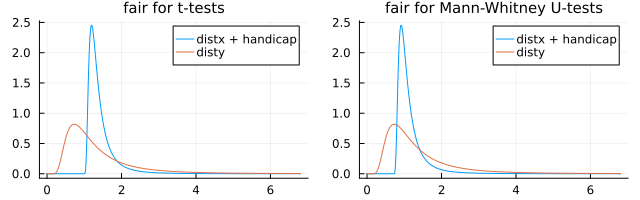

In [36]:
distx = InverseGamma(3.1, 1)
disty = InverseGamma(3.1, 3)
igx, igy = distx, disty

@show distname(distx) distname(disty)
@show std(disty)/std(distx)
@show skewness(distx) skewness(disty)
@show handicap_mean = mean(disty) - mean(distx)
@show handicap_win_rate = equalizing_handicap(distx, disty)
xmin = min(0, handicap_mean, handicap_win_rate)
xmax = max(5std(distx) + handicap_win_rate, 5std(disty))
xs = range(xmin, xmax, 1000)
P1 = plot(xs, x -> safe_pdf(distx+handicap_mean, x); label="distx + handicap")
plot!(xs, x -> pdf(disty, x); label="disty")
title!("fair for t-tests")
P2 = plot(xs, x -> safe_pdf(distx+handicap_win_rate, x); label="distx + handicap")
plot!(xs, x -> pdf(disty, x); label="disty")
title!("fair for Mann-Whitney U-tests")
plot(P1, P2; size=(640, 200), legend=true)

  1.347213 seconds (40.32 M allocations: 3.815 GiB, 36.40% gc time)


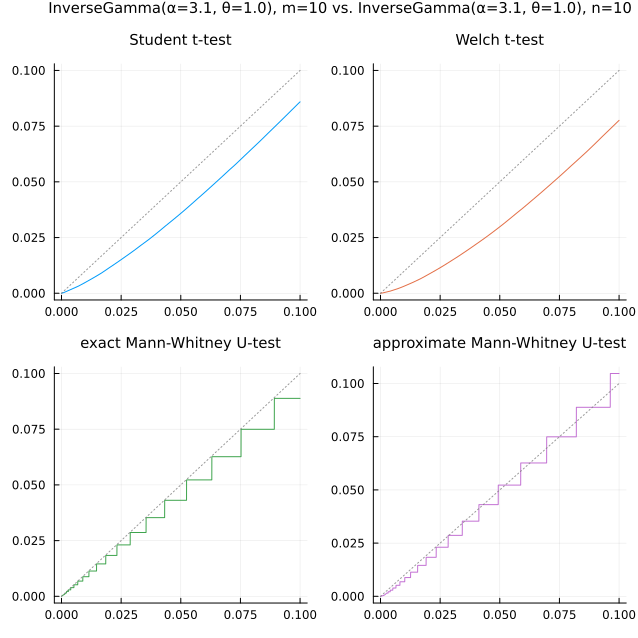

In [37]:
ecdf_p_values(igx, 10, igx, 10; maxalpha=0.1, continuity_correction=false)

 11.602582 seconds (50.49 M allocations: 13.605 GiB, 11.80% gc time)


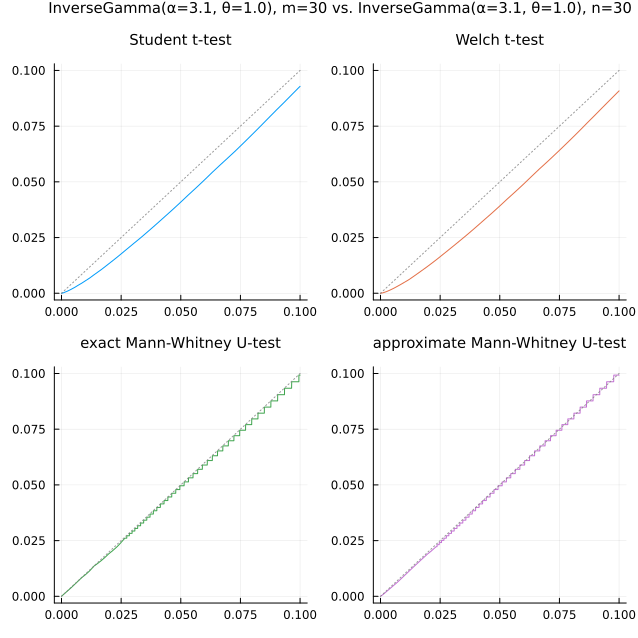

In [38]:
ecdf_p_values(igx, 30, igx, 30; maxalpha=0.1, continuity_correction=false)

  4.773097 seconds (44.38 M allocations: 20.208 GiB, 24.16% gc time)


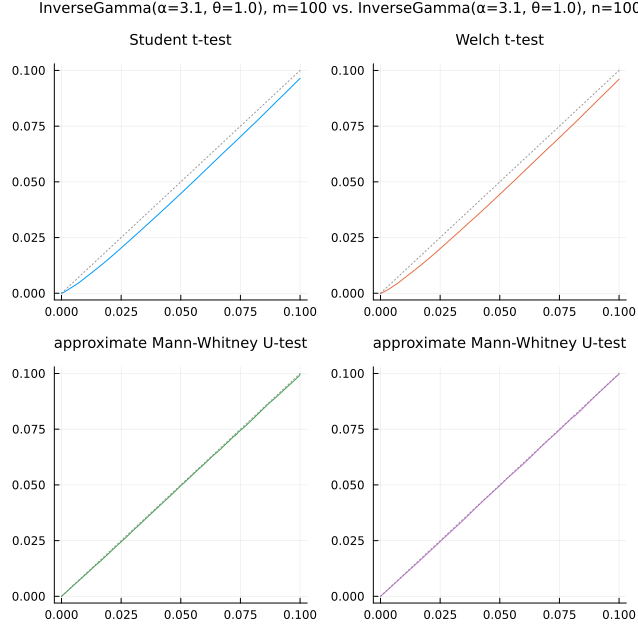

In [39]:
ecdf_p_values(igx, 100, igx, 100; maxalpha=0.1, continuity_correction=false)

  1.059849 seconds (40.08 M allocations: 3.770 GiB, 23.01% gc time)


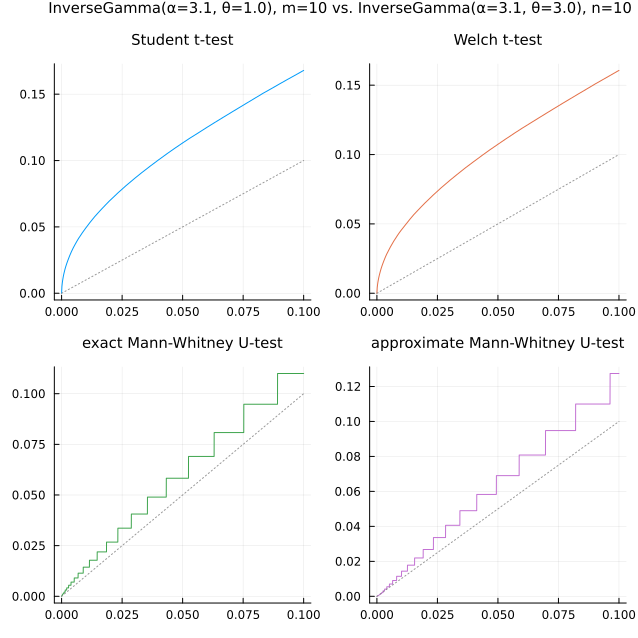

In [40]:
ecdf_p_values(igx, 10, igy, 10; maxalpha=0.1, continuity_correction=false)

  2.583070 seconds (45.58 M allocations: 7.382 GiB, 23.22% gc time)


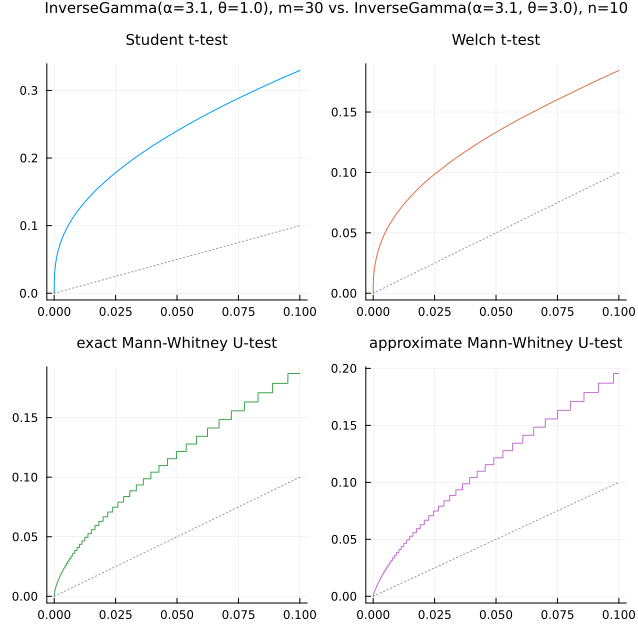

In [41]:
ecdf_p_values(igx, 30, igy, 10; maxalpha=0.1, continuity_correction=false)

  2.443054 seconds (43.11 M allocations: 7.197 GiB, 16.59% gc time)


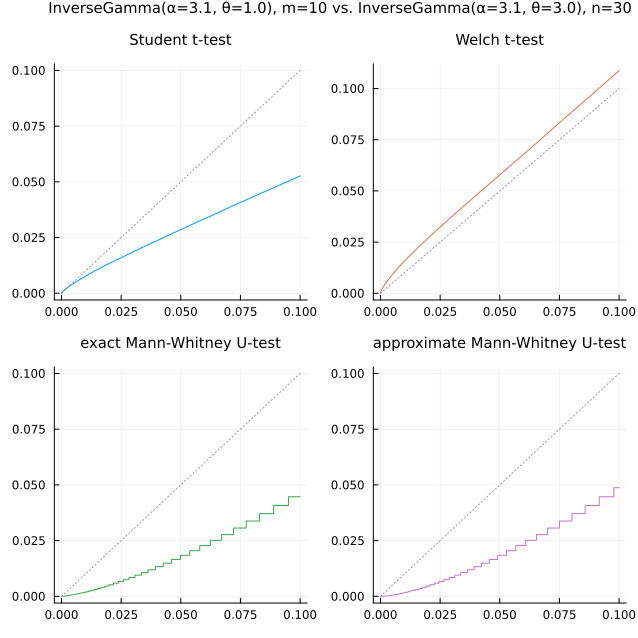

In [42]:
ecdf_p_values(igx, 10, igy, 30; maxalpha=0.1, continuity_correction=false)

  4.749940 seconds (44.54 M allocations: 20.230 GiB, 23.67% gc time)


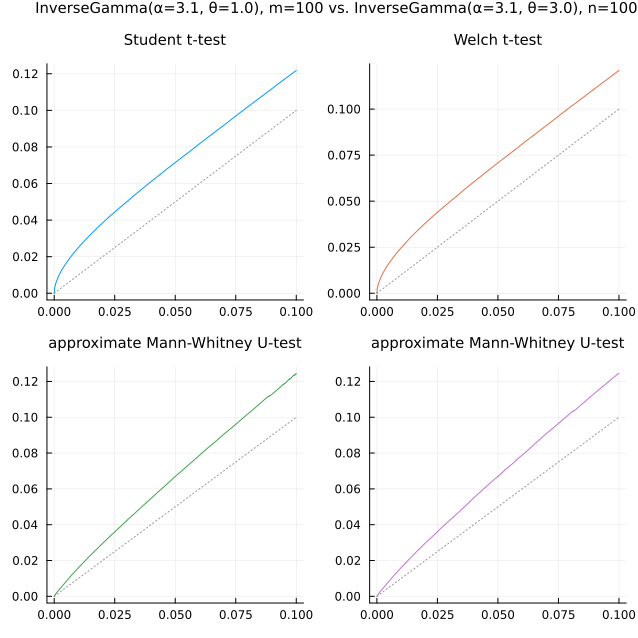

In [43]:
ecdf_p_values(igx, 100, igy, 100; maxalpha=0.1, continuity_correction=false)

 10.128286 seconds (58.06 M allocations: 38.554 GiB, 29.92% gc time)


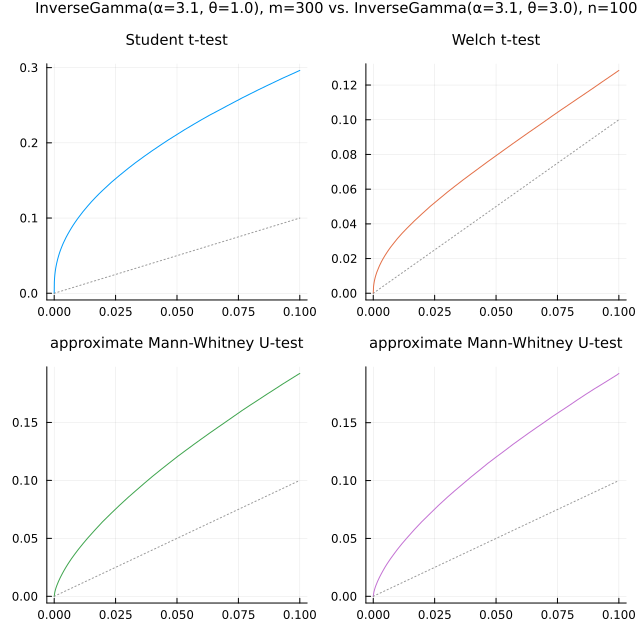

In [44]:
ecdf_p_values(igx, 300, igy, 100; maxalpha=0.1, continuity_correction=false)

 10.144280 seconds (54.82 M allocations: 38.096 GiB, 30.55% gc time)


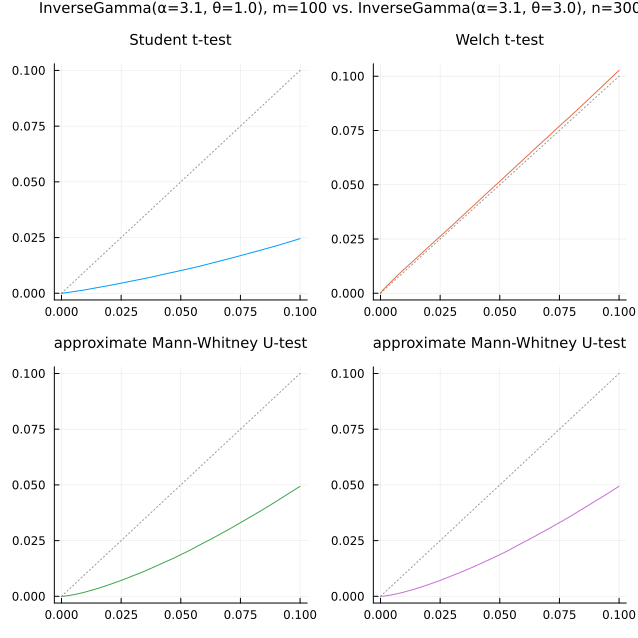

In [45]:
ecdf_p_values(igx, 100, igy, 300; maxalpha=0.1, continuity_correction=false)

 15.825406 seconds (60.39 M allocations: 56.198 GiB, 29.50% gc time)


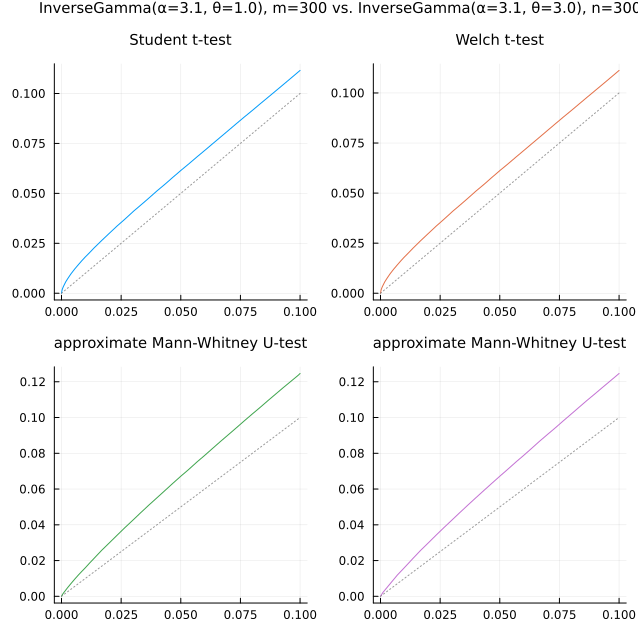

In [46]:
ecdf_p_values(igx, 300, igy, 300; maxalpha=0.1, continuity_correction=false)

  3.030514 seconds (6.42 M allocations: 10.117 GiB, 24.49% gc time)


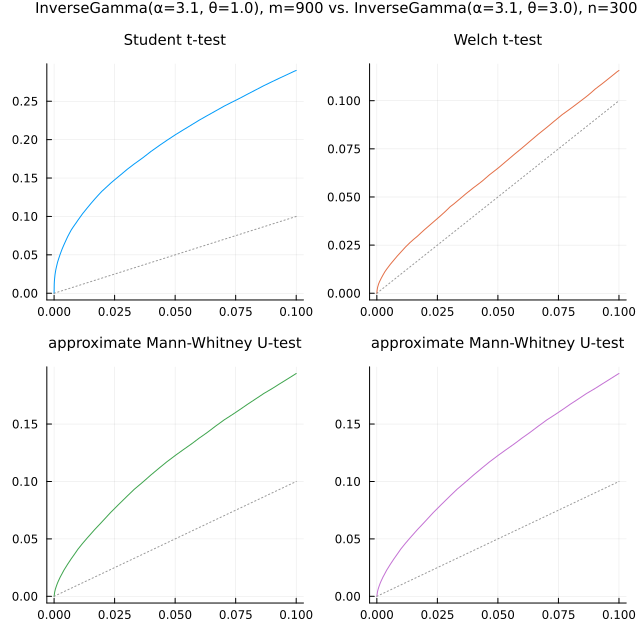

In [47]:
ecdf_p_values(igx, 900, igy, 300; maxalpha=0.1, continuity_correction=false, niters=10^5)

  2.958869 seconds (6.10 M allocations: 10.072 GiB, 24.02% gc time)


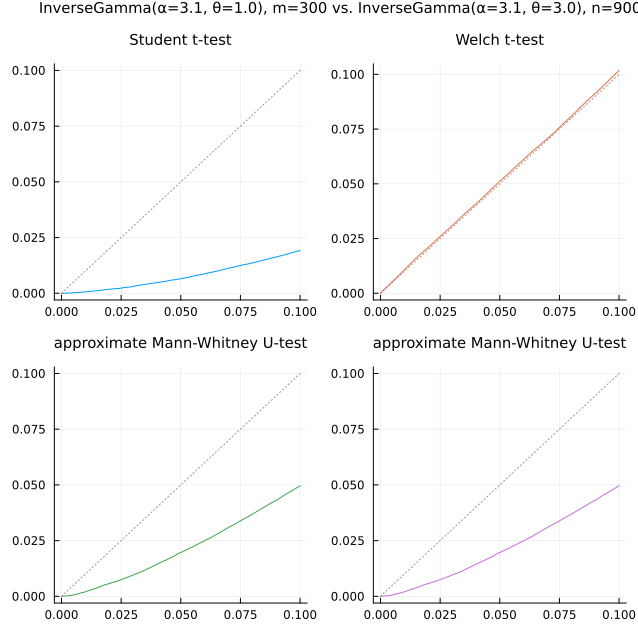

In [48]:
ecdf_p_values(igx, 300, igy, 900; maxalpha=0.1, continuity_correction=false, niters=10^5)

  4.666334 seconds (6.48 M allocations: 14.570 GiB, 21.86% gc time)


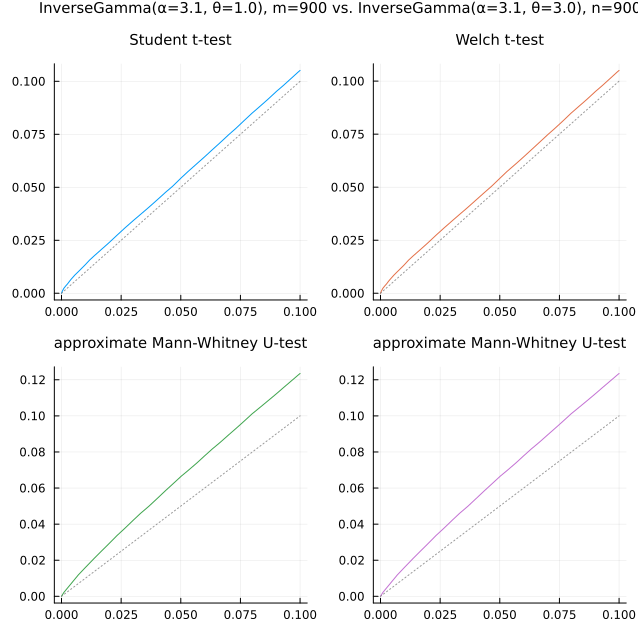

In [49]:
ecdf_p_values(igx, 900, igy, 900; maxalpha=0.1, continuity_correction=false, niters=10^5)

 10.420961 seconds (6.81 M allocations: 28.549 GiB, 33.99% gc time)


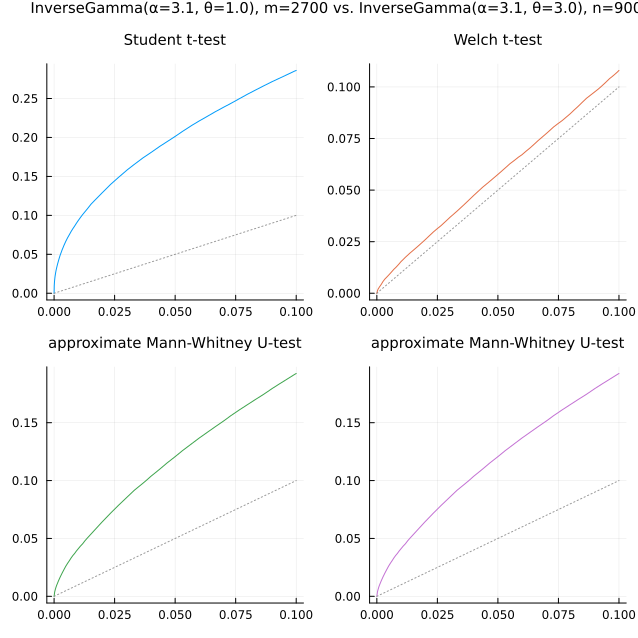

In [50]:
ecdf_p_values(igx, 2700, igy, 900; maxalpha=0.1, continuity_correction=false, niters=10^5)

 15.093040 seconds (6.84 M allocations: 42.484 GiB, 30.09% gc time)


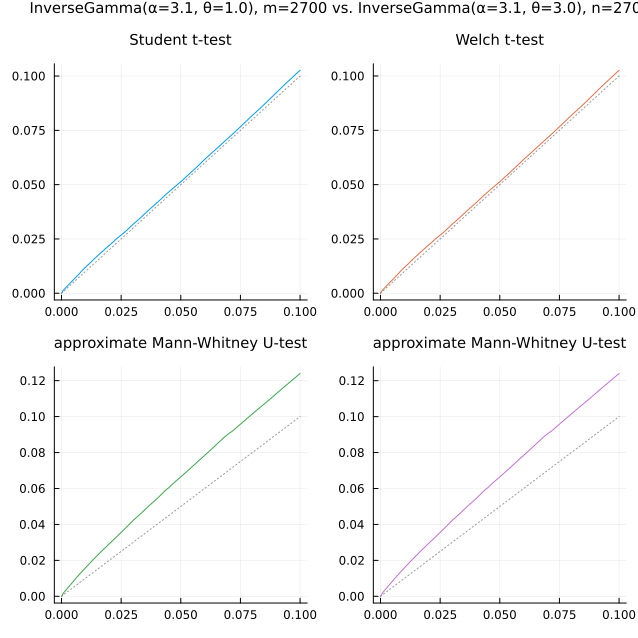

In [51]:
ecdf_p_values(igx, 2700, igy, 2700; maxalpha=0.1, continuity_correction=false, niters=10^5)